In [7]:
import matplotlib.pyplot as plt
import numpy as np
import cv2


In [8]:
class Shower:
    def show_img(
        img_mtx: np.ndarray, 
        extra_img_params: dict = {}, 
        in_gray: bool=True, 
        is_show: bool=True,
        title: str=None,
        figsize: tuple=None
    ):
        '''
            cmap='gray': display the image in grayscale
        '''
        
        if in_gray:
            img_params = {'X': img_mtx} | {'cmap':'gray'} | extra_img_params
        else:
            img_params ={'X': img_mtx} | extra_img_params

        if figsize is not None:
            plt.figure(figsize=figsize)

        plt.imshow(**img_params)
        plt.axis('off')

        if title:
            plt.title(title)

        if is_show:
            plt.show()


    def show_two_img(
        img_mtx1: np.ndarray, 
        img_mtx2: np.ndarray,
        title_img1: str = None,
        title_img2: str = None,
        extra_img1_params: dict = {},
        extra_img2_params: dict = {},
        figsize: tuple=(8, 12)
    ):
        plt.figure(figsize=figsize)

        plt.subplot(1, 2, 1)
        Shower.show_img(img_mtx1, extra_img1_params, is_show=False)
        if title_img1:
            plt.title(title_img1)

        plt.subplot(1, 2, 2)
        Shower.show_img(img_mtx2, extra_img2_params, is_show=False)
        if title_img2:
            plt.title(title_img2)

        plt.tight_layout() # fit into the figure area without overlapping
        plt.show()


In [9]:
PICTURES_PATH = 'materials/imgs/'


 # 1. Детектор углов Харриса

In [10]:
PICTURE1_PATH = PICTURES_PATH + 'house_photo.jpeg'

PICTURE1_PATH


'materials/imgs/house_photo.jpeg'

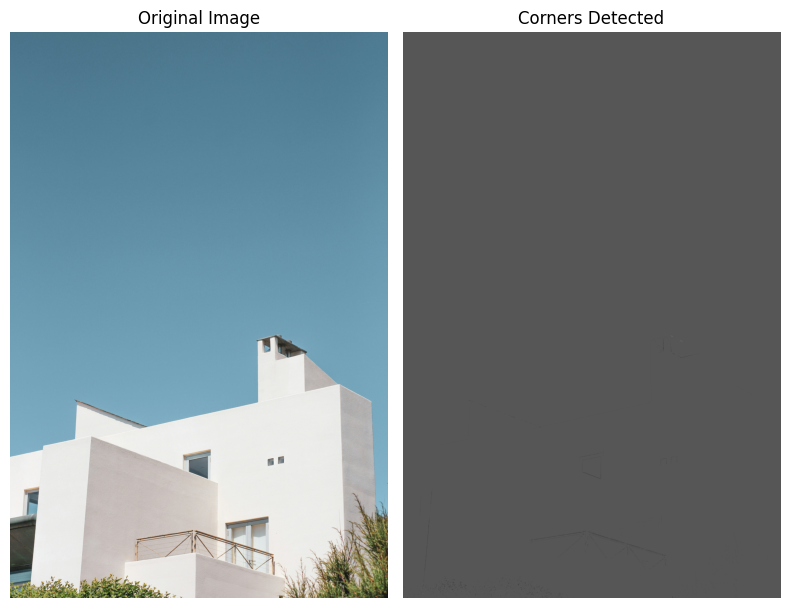

In [11]:
# Считывание изображения
image = cv2.imread(PICTURE1_PATH)

# Создание копии изображения
image_copy = np.copy(image)

# Преобразование цветов из BGR в RGB
image_copy = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)


# Преобразование изображения в градации серого
gray = cv2.cvtColor(image_copy, cv2.COLOR_RGB2GRAY)
gray = np.float32(gray)


# Обнаружение углов
dst = cv2.cornerHarris(gray, 2, 3, 0.05)


# Нормализация результата для корректного отображения
dst_normalized = cv2.normalize(dst, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
dst_normalized = np.uint8(dst_normalized)



Shower.show_two_img(
    image_copy,
    dst_normalized,
    title_img1='Original Image',
    title_img2='Corners Detected',
    extra_img1_params={'cmap': None},
    # figsize=(10, 5)
)


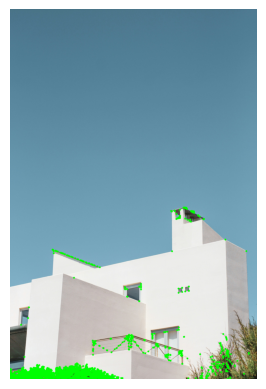

In [6]:
# Это значение зависит от изображения и количества углов, которые вы хотите обнаружить
# Попробуйте изменить этот свободный параметр (0.1), сделав его больше или меньше, и посмотрите результат
threshold = 0.01 * dst.max()

# Создание копии изображения для отображения углов
corner_image = np.copy(image_copy)

# Проход по всем углам и их отрисовка на изображении (если они проходят пороговое значение)
for j in range(0, dst.shape[0]):
    for i in range(0, dst.shape[1]):
        if(dst[j, i] > threshold):
            # параметры: изображение, точка центра, радиус, цвет, толщина
            cv2.circle(corner_image, (i, j), 1, (0, 255, 0), 20)


# Отображение изображения с углами
Shower.show_img(corner_image, in_gray=False)


 # ДЗ часть 1: Реализация функции детектирования углов Харриса



 Используя указанный выше код для получения признаков детектором углов Харриса напишите функцию, которая на вход получает путь к изображению, возвращая результат найденных детектером признаков и выводя финальное изображение на экран.

In [12]:
def corners_detection(
    filepath: str, threshold: float=0.01, dotsize: int=5
) -> np.ndarray:
    # Считывание изображения
    image = cv2.imread(filepath)

    # Создание копии изображения
    corner_image = np.copy(image)
    # Преобразование цветов из BGR в RGB
    corner_image = cv2.cvtColor(corner_image, cv2.COLOR_BGR2RGB)

    # Преобразование изображения в градации серого
    gray = cv2.cvtColor(corner_image, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)

    # Обнаружение углов
    dst = cv2.cornerHarris(gray, 2, 3, 0.05)

    # Это значение зависит от изображения и количества углов, которые вы хотите обнаружить
    threshold = threshold * dst.max()

    # Проход по всем углам и их отрисовка на изображении (если они проходят пороговое значение)
    for j in range(0, dst.shape[0]):
        for i in range(0, dst.shape[1]):
            if (dst[j, i] > threshold):
                # параметры: изображение, точка центра, радиус, цвет, толщина
                cv2.circle(corner_image, (i, j), 1, (0, 255, 0), dotsize)

    # Отображение изображения с углами
    Shower.show_img(corner_image, in_gray=False)

    return dst


In [13]:
PICTURE2_PATH = PICTURES_PATH + 'street_2.jpeg'

PICTURE2_PATH


'materials/imgs/street_2.jpeg'

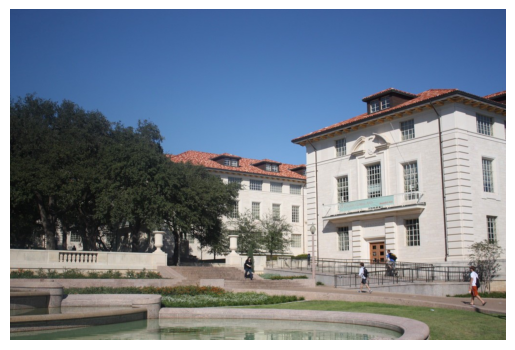

In [14]:
image = cv2.imread(PICTURE2_PATH)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Shower.show_img(image)


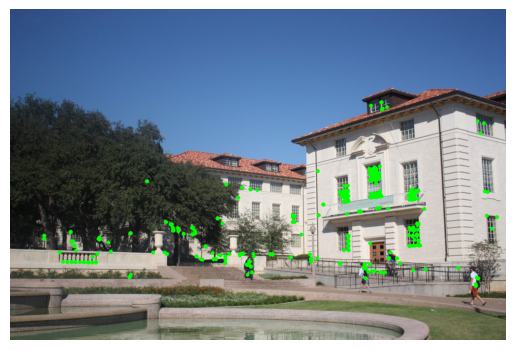

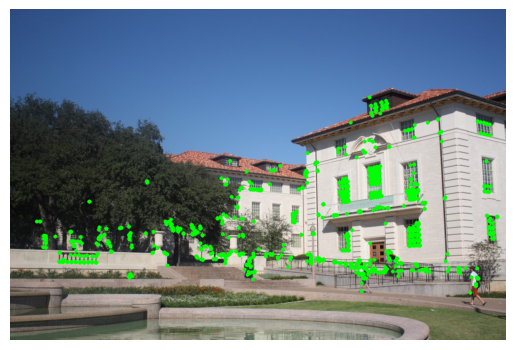

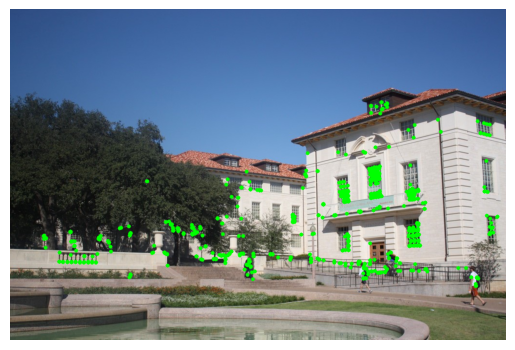

array([[ 3.2495117e-01,  3.2495117e-01,  3.9179689e-01, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 3.2495117e-01,  3.2495117e-01,  3.9179689e-01, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-1.8800781e+00, -1.8800781e+00, -1.2676270e+00, ...,
        -1.2500000e-02, -1.2500000e-02, -1.2500000e-02],
       ...,
       [ 1.5229492e-01,  1.5229492e-01,  1.0867188e+00, ...,
         3.0534374e+01,  1.8985429e+02,  5.5494482e+02],
       [-7.8126788e-04, -7.8126788e-04,  3.0460937e+00, ...,
         2.4565624e+01,  1.9173511e+02,  1.1563984e+02],
       [ 2.8984374e-01,  2.8984374e-01,  2.0148437e+00, ...,
        -3.5437498e+00,  5.1305614e+01,  2.2971874e+01]], dtype=float32)

In [15]:
corners_detection(PICTURE2_PATH, threshold=0.2)
corners_detection(PICTURE2_PATH, threshold=0.1)
corners_detection(PICTURE2_PATH, threshold=0.15)


 # 2. SIFT алгоритм

In [16]:
PICTURE3_PATH = PICTURES_PATH + 'house_photo_2.jpg'

PICTURE3_PATH


'materials/imgs/house_photo_2.jpg'

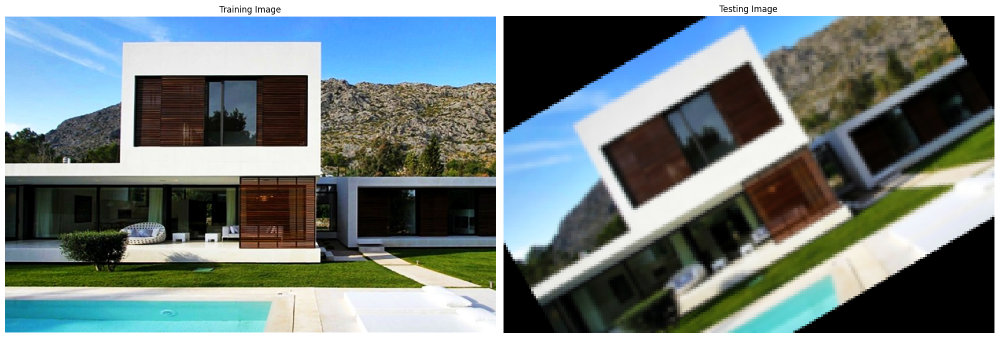

In [17]:
# Загрузка
image1 = cv2.imread(PICTURE3_PATH)

# Конвертируем исходное изображение в RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
# Конвертируем исходное изображение в gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Создаем изображение для теста для его поворота и проверки инвариантности алгоритма
test_image = cv2.pyrDown(training_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Отобразим изображения
Shower.show_two_img(
    training_image,
    test_image,
    title_img1='Training Image',
    title_img2='Testing Image',
    figsize=(20, 10)
)


[ WARN:0@22.067] global shadow_sift.hpp:15 SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


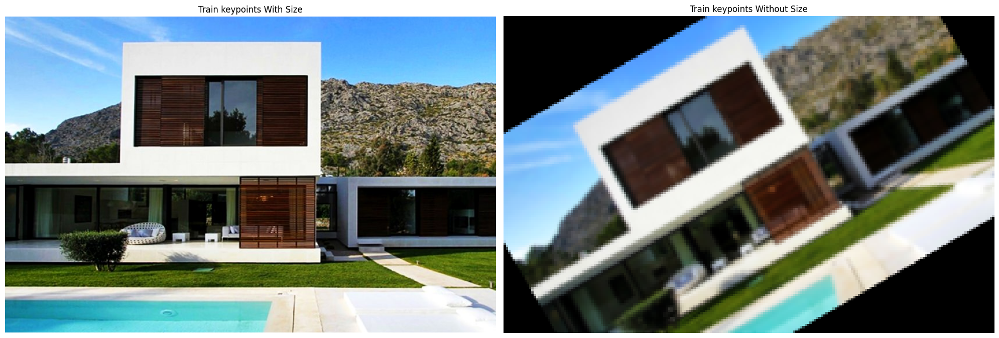

Number of Keypoints Detected In The Training Image:  3397
Number of Keypoints Detected In The Query Image:  200


In [18]:
# Создаем инстанс (экземпляр класса) SIFT метода

sift = cv2.xfeatures2d.SIFT_create()


# Найдем ключевые точки на исходном и тестовым снимках

train_keypoints, train_descriptor = sift.detectAndCompute(training_gray, None)

test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)


# Копирование ключевых точек

keypoints_without_size = np.copy(training_image)

keypoints_with_size = np.copy(training_image)


# Отображение ключевых точек

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


# Отобразим изображение с и без размеров ключевых точек

Shower.show_two_img(
    training_image,
    test_image,
    title_img1='Train keypoints With Size',
    title_img2='Train keypoints Without Size',
    extra_img1_params={'cmap': 'gray'},
    extra_img2_params={'cmap': 'gray'},
    figsize=(20, 10)
)


# Отобразим количество ключевых точек на исходном и тестовом снимках

print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))


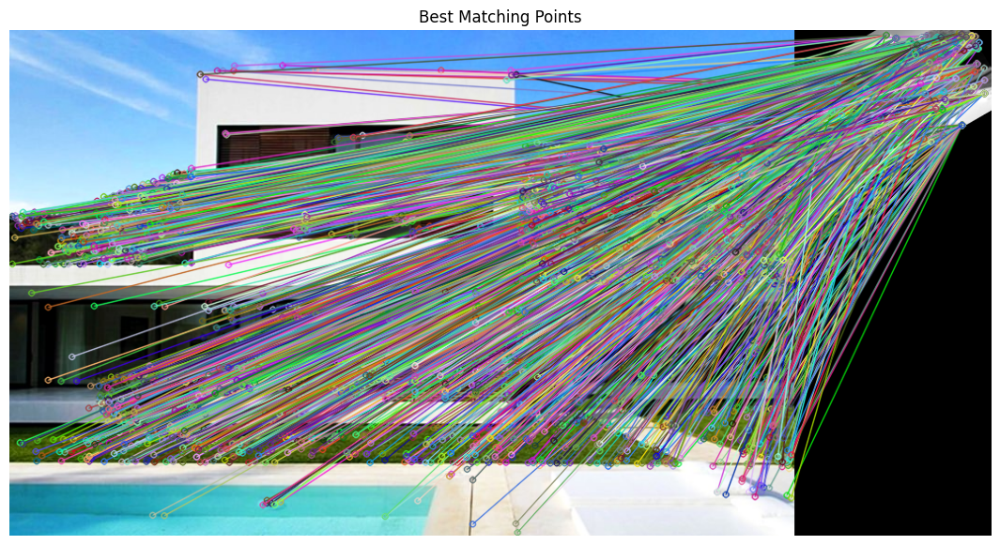


Number of Matching Keypoints Between The Training and Query Images:  3397


In [19]:
# Создаем объект прямого алгоритма сопоставления
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)

# Сопостовляем признаковое описание (128-элементные векторы) между исходным и тестовым снимкам
matches = bf.match(train_descriptor, test_descriptor)

# Результаты с наименьшим расстоянием (между векторами) - то что нужно
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# [DEFINE ME] Отображаем лучшие ключевые точки
plt.rcParams['figure.figsize'] = [14.0, 7.0]
Shower.show_img(
    result,
    title='Best Matching Points'
)

print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

 # ДЗ часть 2*: Реализация функции SIFT метода

 Используя код выше для реализации SIFT метода для поиска ключевых точек и вынесения соотвествия между изображениями создайте функцию, которая будет на вход принимать путь к двум изображениям и в результате выполнения возвращать соотнесенные ключевые точки.



 Учтите, что в качестве изображений для работы у вас будет две разные картинки площади, имеющих одну общую часть, для которой и необходимо выполнить поиск (мы с вами на практике 11 уже видели их). Т.е. в качестве train_image у вас должно быть просто второе изображение, над которым не нужно проводить транфсормаций.



 **Также можете добавить результаты выполнения промежуточных преобразований, как указано выше.**

In [24]:
class SIFT:
    @staticmethod
    def _show_keypoints_pics(
        training_image, test_image, train_keypoints, test_keypoints
    ):
        # Отобразим изображение с и без размеров ключевых точек
        Shower.show_two_img(
            training_image,
            test_image,
            title_img1='Train keypoints With Size',
            title_img2='Train keypoints Without Size',
            extra_img1_params={'cmap': 'gray'},
            extra_img2_params={'cmap': 'gray'},
            figsize=(20, 10)
        )

        # Отобразим количество ключевых точек на исходном и тестовом снимках
        print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))
        print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

    
    @staticmethod
    def _keypoints_detector(training_gray, test_gray):
        # Создаем инстанс (экземпляр класса) SIFT метода
        sift = cv2.xfeatures2d.SIFT_create()

        # Найдем ключевые точки на исходном и тестовым снимках
        train_keypoints, train_descriptor = sift.detectAndCompute(
            training_gray, None)
        test_keypoints, test_descriptor = sift.detectAndCompute(
            test_gray, None)

        # Копирование ключевых точек
        keypoints_without_size = np.copy(training_image)
        keypoints_with_size = np.copy(training_image)

        # Отображение ключевых точек
        cv2.drawKeypoints(
            training_image,
            train_keypoints,
            keypoints_without_size,
            color=(0, 255, 0)
        )

        cv2.drawKeypoints(
            training_image,
            train_keypoints,
            keypoints_with_size,
            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
        )

        return train_keypoints, train_descriptor, test_keypoints, test_descriptor
    

    @staticmethod
    def _descriptions_matching(
        training_image,
        train_keypoints,
        test_gray,
        test_keypoints,
        train_descriptor,
        test_descriptor
    ):
        # Создаем объект прямого алгоритма сопоставления
        bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)

        # Сопостовляем признаковое описание (128-элементные векторы) между исходным и тестовым снимкам
        matches = bf.match(train_descriptor, test_descriptor)

        # Результаты с наименьшим расстоянием (между векторами) - то что нужно
        matches = sorted(matches, key = lambda x : x.distance)

        result = cv2.drawMatches(
            training_image, 
            train_keypoints, 
            test_gray, 
            test_keypoints, 
            matches, 
            test_gray, 
            flags = 2
        )

        return result


    @staticmethod
    def sift_realization(impath1: str, impath2: str, show_steps: bool=True):
        image1 = cv2.imread(impath1)
        image2 = cv2.imread(impath2)

        training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

        test_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

        train_keypoints, train_descriptor, test_keypoints, test_descriptor = \
            SIFT._keypoints_detector(training_gray, test_gray)

        if show_steps: 
            SIFT._show_keypoints_pics(
                training_image, test_image, train_keypoints, test_keypoints
            )

        result = SIFT._descriptions_matching(
            training_image,
            train_keypoints,
            test_gray,
            test_keypoints,
            train_descriptor,
            test_descriptor
        )

        plt.rcParams['figure.figsize'] = [14.0, 7.0]
        Shower.show_img(
            result,
            title='Best Matching Points'
        )

        print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

        return result

In [25]:
PICTURE4_PATH = PICTURES_PATH + 'street_1.jpeg'
PICTURE5_PATH = PICTURES_PATH + 'street_2.jpeg'


PICTURE4_PATH, PICTURE5_PATH

('materials/imgs/street_1.jpeg', 'materials/imgs/street_2.jpeg')

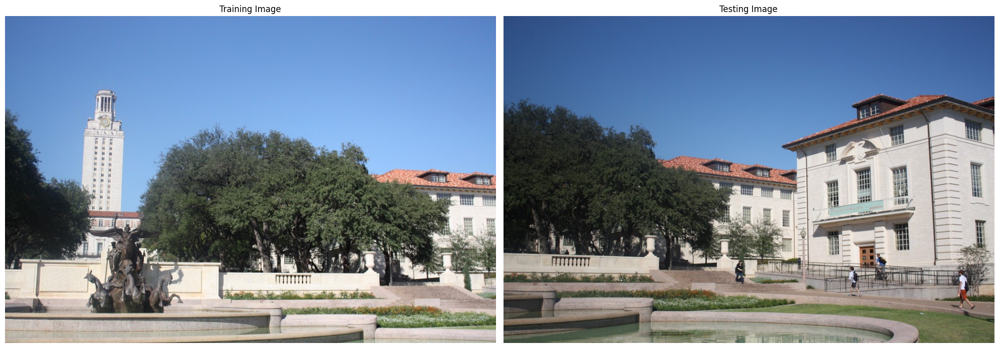

In [26]:
image1= cv2.imread(PICTURE4_PATH)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

image2= cv2.imread(PICTURE5_PATH)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

Shower.show_two_img(
    image1,
    image2,
    title_img1='Training Image',
    title_img2='Testing Image',
    figsize=(20, 10)
)


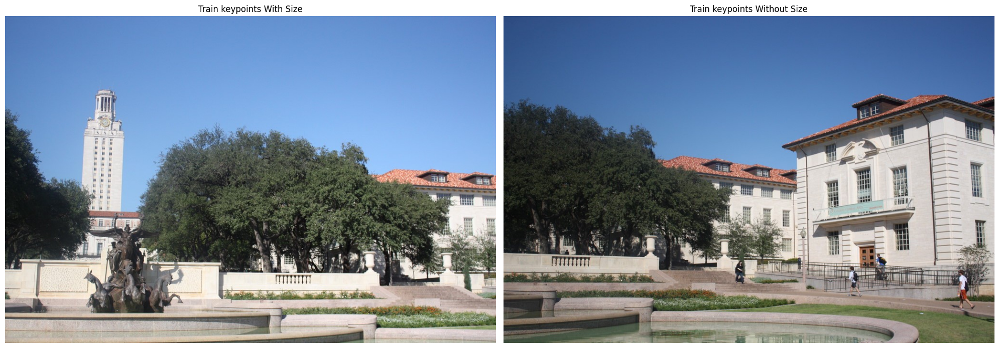

Number of Keypoints Detected In The Training Image:  5346
Number of Keypoints Detected In The Query Image:  4239


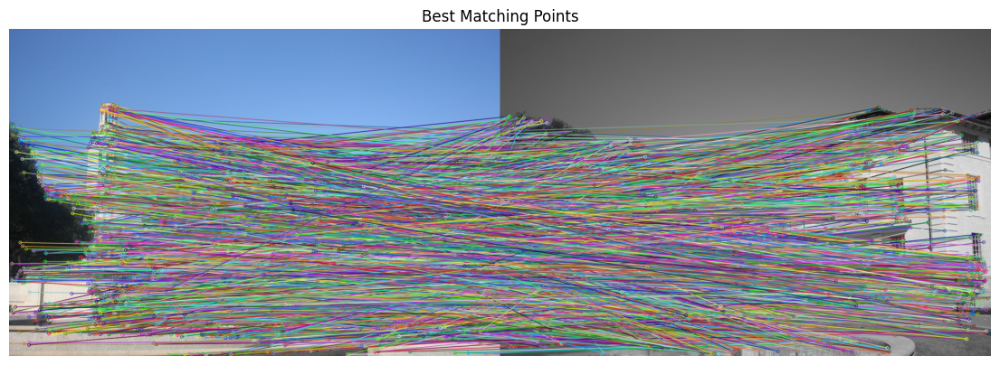


Number of Matching Keypoints Between The Training and Query Images:  3397


array([[[ 74, 112, 174],
        [ 75, 113, 175],
        [ 76, 114, 176],
        ...,
        [ 79,  79,  79],
        [ 79,  79,  79],
        [ 79,  79,  79]],

       [[ 75, 113, 175],
        [ 75, 113, 175],
        [ 76, 114, 176],
        ...,
        [ 79,  79,  79],
        [ 79,  79,  79],
        [ 79,  79,  79]],

       [[ 76, 114, 176],
        [ 77, 115, 177],
        [ 77, 115, 177],
        ...,
        [ 79,  79,  79],
        [ 79,  79,  79],
        [ 79,  79,  79]],

       ...,

       [[187, 170, 150],
        [188, 171, 151],
        [193, 176, 156],
        ...,
        [ 80,  80,  80],
        [ 81,  81,  81],
        [ 82,  82,  82]],

       [[182, 164, 144],
        [184, 166, 146],
        [190, 172, 152],
        ...,
        [ 81,  81,  81],
        [ 83,  83,  83],
        [ 84,  84,  84]],

       [[151, 130, 109],
        [155, 134, 113],
        [164, 143, 122],
        ...,
        [ 82,  82,  82],
        [ 85,  85,  85],
        [ 86,  86,  86]]

In [27]:
SIFT.sift_realization(PICTURE4_PATH, PICTURE5_PATH)